# Import libraries and dataset

In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from termcolor import colored

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

from sklearn.metrics import classification_report
from sklearn import metrics

sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
pd.set_option('display.max_columns',29)

In [5]:
df = pd.read_csv("diabetes.csv")

# Exploring data and cleaning data

In [6]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [7]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


In [8]:
print(f"Columns name in the dataset: {colored(df.columns, 'magenta')}")

Columns name in the dataset: Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [9]:
print(f"Shape of the dataset: {colored(df.shape, 'magenta')}")

Shape of the dataset: (768, 9)


**Observations:**

There are 9 columns and 768 rows. "Outcome" column is our target feature (Dependent variable). Other columns are independent features.

In [10]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


**Observations:**

There are no null values in our dataset.

##### We have to check whether columns like "BloodPressure" contains zero or not as age can't be zero.

In [12]:
for i in df.columns:
    print(i,len(df[df[i] == 0]))

Pregnancies 111
Glucose 5
BloodPressure 35
SkinThickness 227
Insulin 374
BMI 11
DiabetesPedigreeFunction 0
Age 0
Outcome 500


**Observations:**

"Pregnancies" column may contain zeros as it will indicate no pregnancies. But Glucose, skinthickness, blood pressure, BMI, and Insulin can never be zero. So we have to change that all zeros to null values then we fill replace/remove null values.

## Replacing Zeros and Nan values

In [13]:
df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']] = df[['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']].replace(0,np.nan)
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

**Observations:**

We have successfully replace zeros with Nan in our required columns of dataset. Now we have to replace it using ffill or bfill method.

In [14]:
df = df.fillna(method = 'ffill')
df = df.fillna(method = 'bfill')
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

## Outlier detection

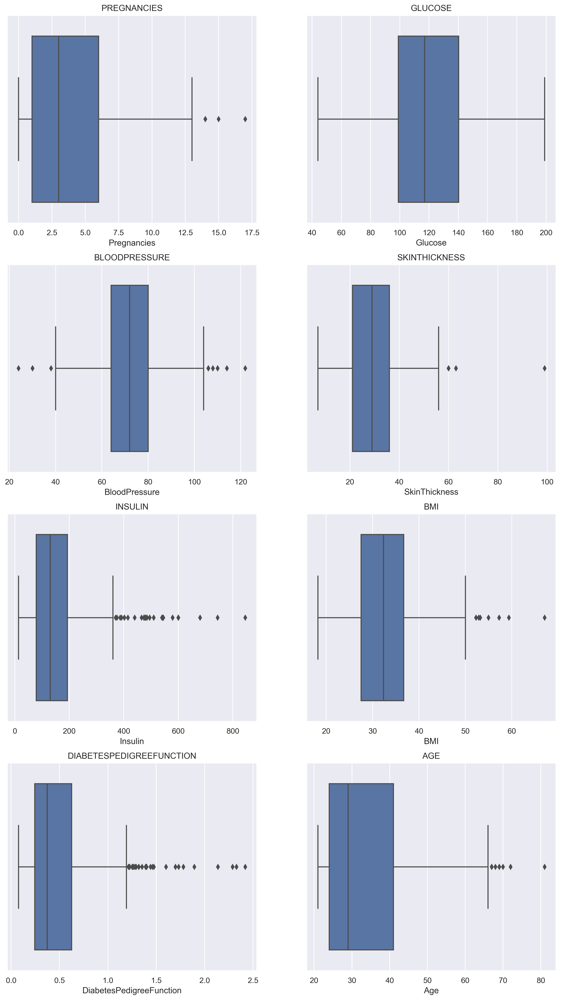

In [15]:
fig1, axes1 =plt.subplots(4,2,figsize=(14, 25))
list1_col= df.columns
for i in range(len(list1_col)-1):
    row=i//2
    col=i%2
    ax=axes1[row,col]
    sns.boxplot(df[list1_col[i]],ax=ax).set(title= list1_col[i].upper())

**Observations:**

Pregnancies can not be of 15 or 16 months hence there was outlier in "Pregnancies" column. Similarly there is outlier in "Insulin", "SkinThickness", "BMI", "DiabetesPedigreeFunction", and "Pregnancies" columns.

In [16]:
print(df.Insulin.shape)
print(df.SkinThickness.shape)
print(df.BMI.shape)
print(df.DiabetesPedigreeFunction.shape)
print(df.Pregnancies.shape)

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

df = df[~((df.iloc[:,4:5] < (Q1 - 1.5 * IQR)) |(df.iloc[:,4:5] > (Q3 + 1.5 * IQR))).any(axis=1)] #Insulin
df = df[~((df.iloc[:,3:4] < (Q1 - 1.5 * IQR)) |(df.iloc[:,3:4] > (Q3 + 1.5 * IQR))).any(axis=1)] #SkinThickness
df = df[~((df.iloc[:,5:6] < (Q1 - 1.5 * IQR)) |(df.iloc[:,5:6] > (Q3 + 1.5 * IQR))).any(axis=1)] #BMI
df = df[~((df.iloc[:,6:7] < (Q1 - 1.5 * IQR)) |(df.iloc[:,6:7] > (Q3 + 1.5 * IQR))).any(axis=1)] #DiabetesPedigreeFunction
df = df[~((df.iloc[:,0:1] < (Q1 - 1.5 * IQR)) |(df.iloc[:,0:1] > (Q3 + 1.5 * IQR))).any(axis=1)] #Pregnancies

print(df.Insulin.shape)
print(df.SkinThickness.shape)
print(df.BMI.shape)
print(df.DiabetesPedigreeFunction.shape)
print(df.Pregnancies.shape)

(768,)
(768,)
(768,)
(768,)
(768,)
Pregnancies                   5.0000
Glucose                      41.2500
BloodPressure                16.0000
SkinThickness                15.0000
Insulin                     114.5000
BMI                           9.2250
DiabetesPedigreeFunction      0.3825
Age                          17.0000
Outcome                       1.0000
dtype: float64
(687,)
(687,)
(687,)
(687,)
(687,)


In [17]:
df.shape

(687, 9)

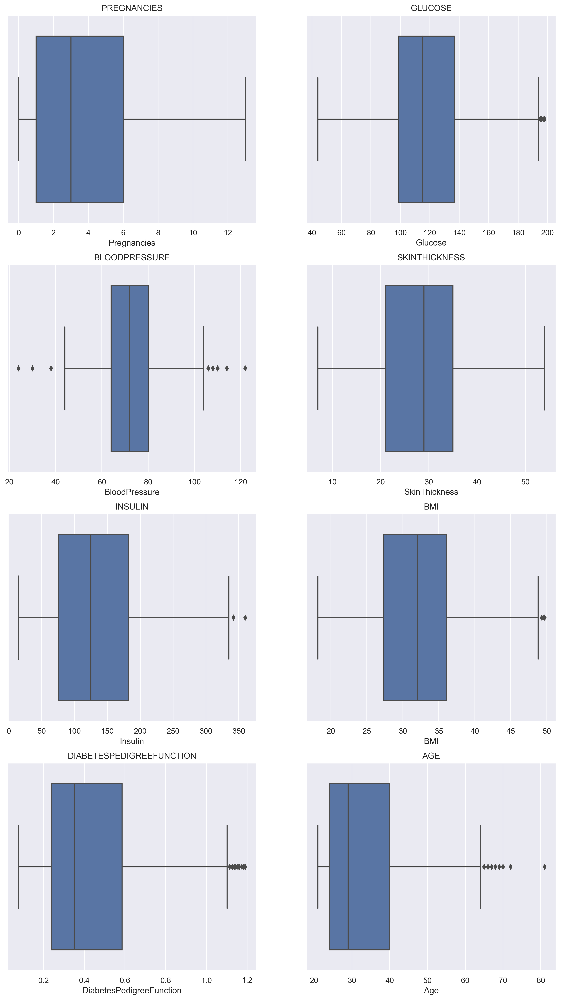

In [18]:
fig1, axes1 =plt.subplots(4,2,figsize=(14, 25))
list1_col= df.columns
for i in range(len(list1_col)-1):
    row=i//2
    col=i%2
    ax=axes1[row,col]
    sns.boxplot(df[list1_col[i]],ax=ax).set(title=list1_col[i].upper())

##### Outlier removed!

In [19]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,687.000000,687.000000,687.000000,687.000000,687.000000,687.000000,687.000000,687.000000,687.000000
mean,3.796215,119.294032,72.160116,28.720524,136.506550,32.027656,0.427544,33.080058,0.320233
std,3.274931,29.370127,12.129428,9.907763,74.747697,6.429451,0.248876,11.764117,0.466906
min,0.000000,44.000000,24.000000,7.000000,15.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,21.000000,76.000000,27.350000,0.238000,24.000000,0.000000
50%,3.000000,115.000000,72.000000,29.000000,125.000000,32.000000,0.351000,29.000000,0.000000
75%,6.000000,137.000000,80.000000,35.000000,182.000000,36.100000,0.586000,40.000000,1.000000
max,13.000000,198.000000,122.000000,54.000000,360.000000,49.700000,1.191000,81.000000,1.000000


# Data visualization

In [20]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,94.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,94.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,94.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
5,5,116.0,74.0,35.0,168.0,25.6,0.201,30,0


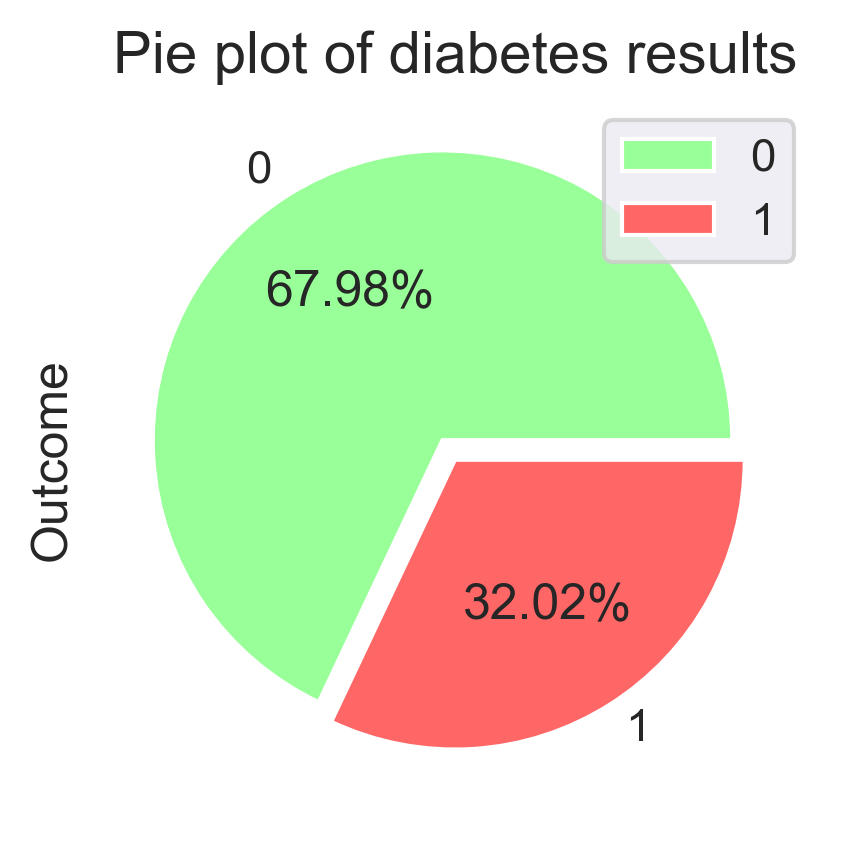

In [21]:
explode=(0.08,0)

df['Outcome'].value_counts().plot.pie(autopct='%1.2f%%',figsize=(3,3),explode=explode,colors=['#99ff99','#ff6666'])
plt.title("Pie plot of diabetes results", fontsize=14)
plt.tight_layout()
plt.legend()
plt.show()

<AxesSubplot:xlabel='Outcome', ylabel='count'>

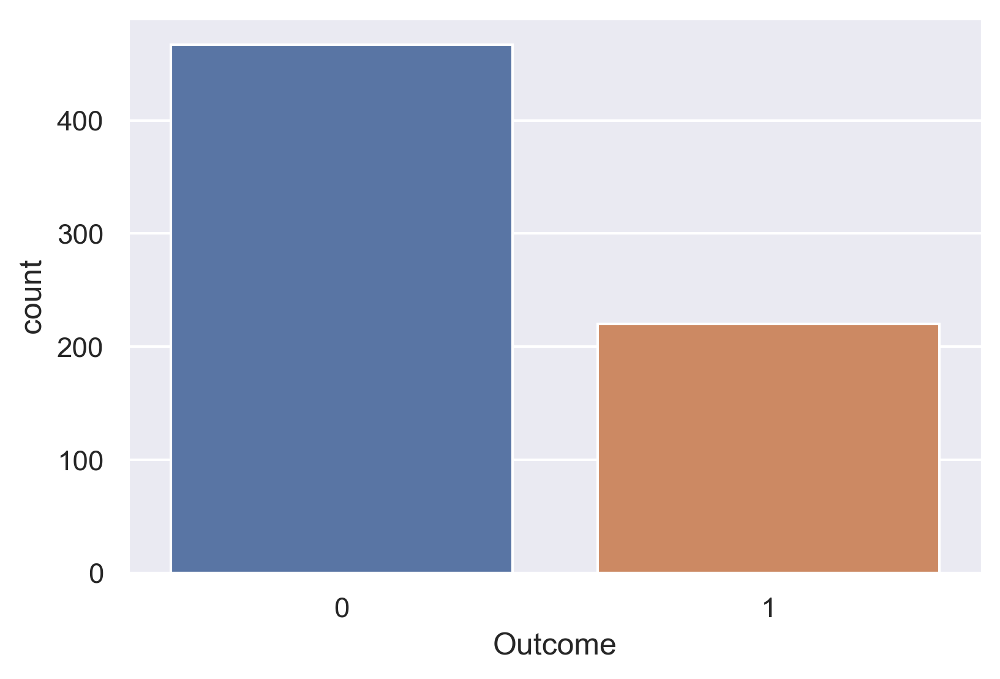

In [22]:
sns.countplot(x = "Outcome", data = df)

In [23]:
df.Outcome.value_counts()

0    467
1    220
Name: Outcome, dtype: int64

**Observations:**

There are 32.02% (220 peoples) people with diabetes and 67.98% (467 peoples) people who are not diagnosed with diabetes.

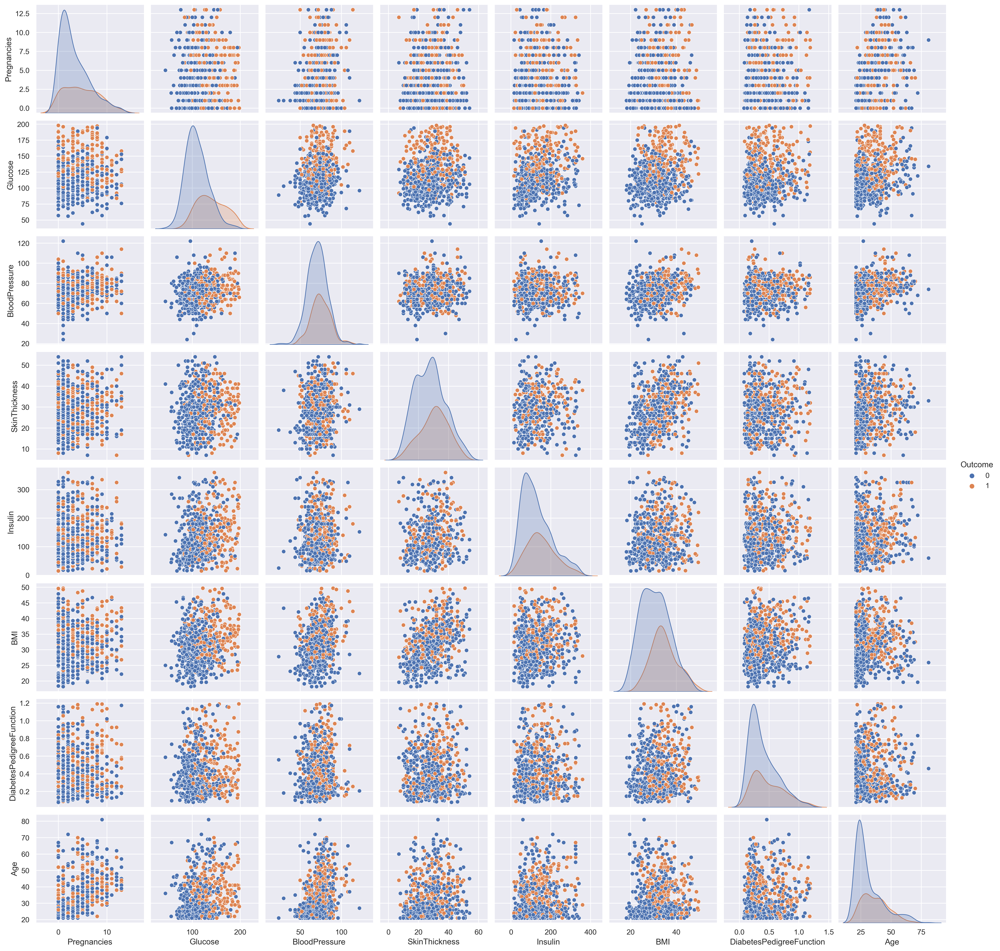

In [24]:
sns.pairplot(df, hue="Outcome", diag_kind="kde")

<AxesSubplot:xlabel='Pregnancies', ylabel='count'>

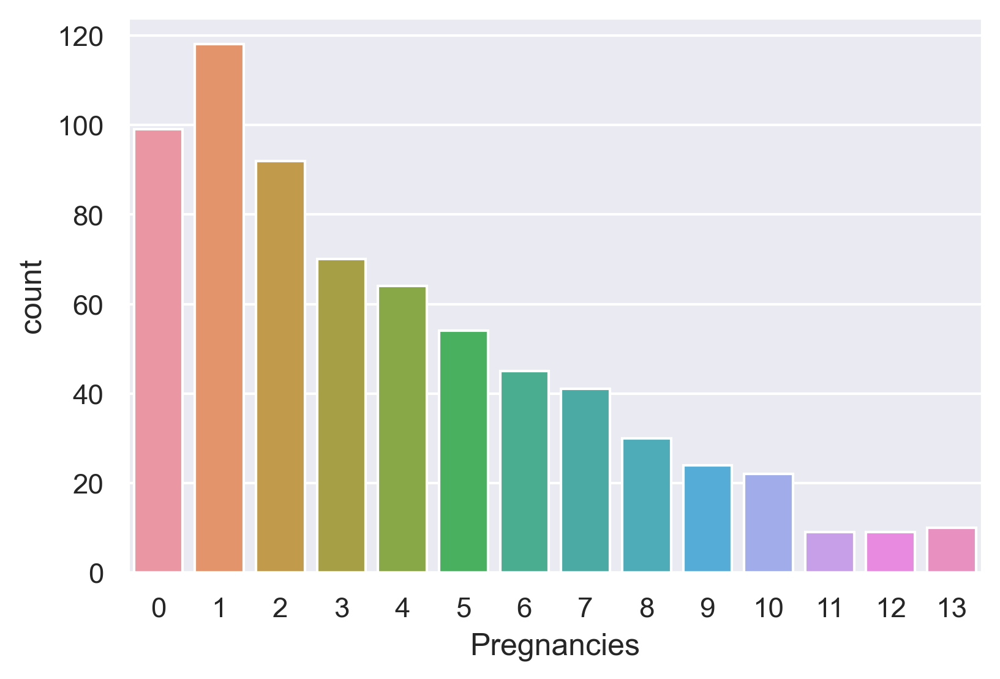

In [25]:
sns.countplot(x = "Pregnancies", data = df)

<AxesSubplot:xlabel='Age', ylabel='count'>

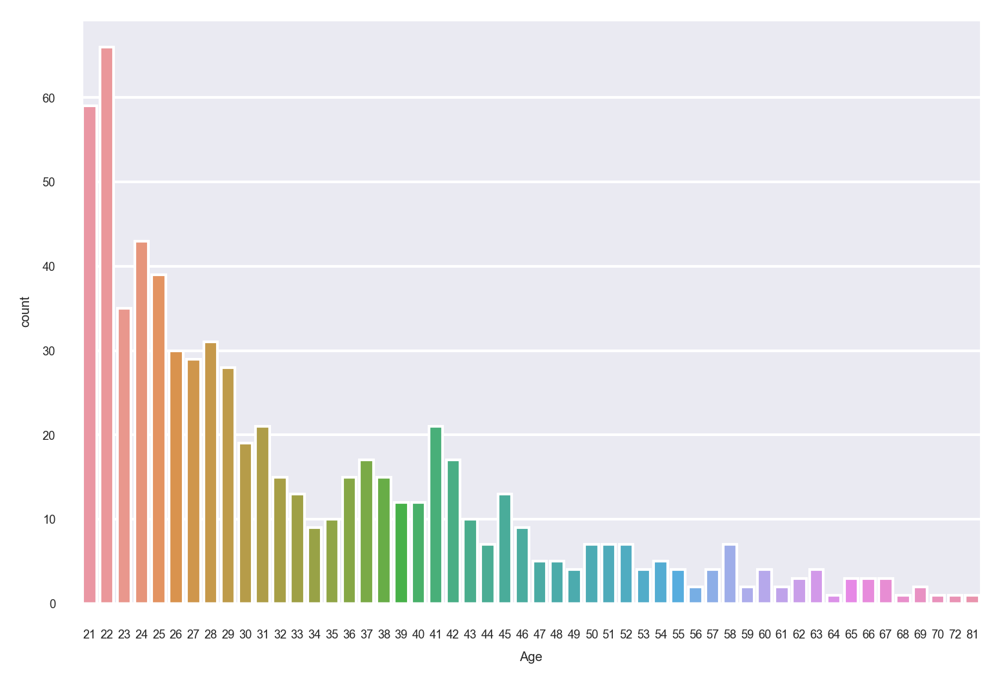

In [26]:
sns.set(font_scale = 0.4)
sns.countplot(x = "Age", data = df)

<AxesSubplot:>

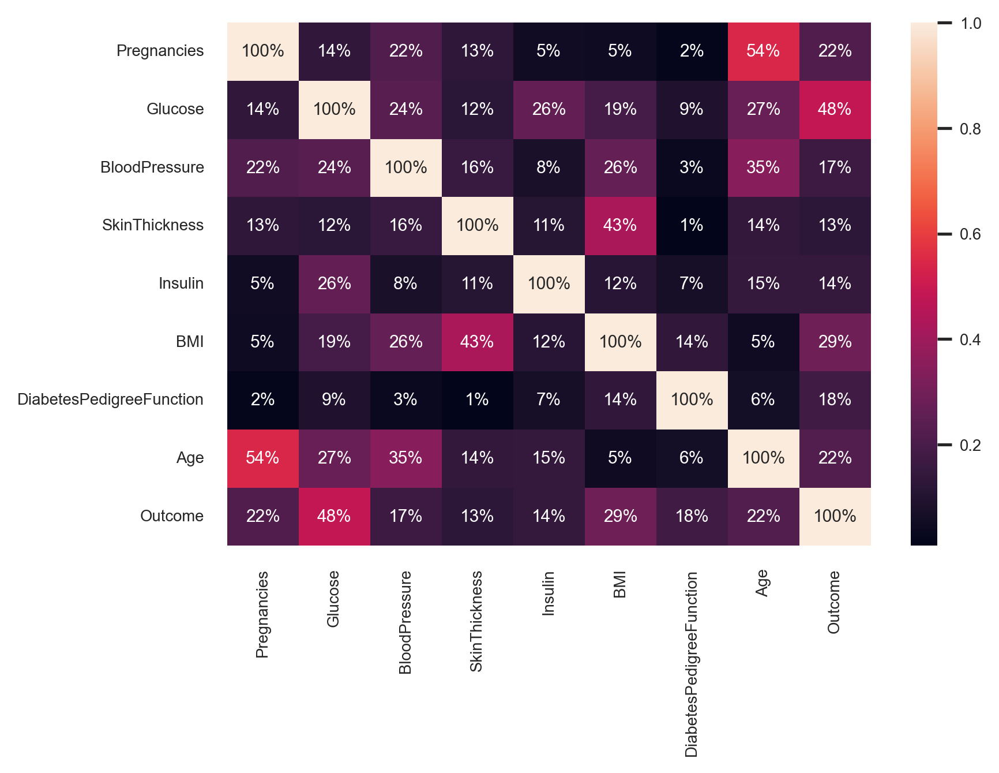

In [27]:
sns.set(font_scale=0.6)
sns.heatmap(df.corr(), annot=True, fmt = '.0%')

**Observations:**

Outcome is 48% correlated with Glucose which is obvious as diabetes is highly dependent on glucose level in our blood.

Also Age and pregnancies is also correlated by 54%. Below 18 age no one can become pregnant also not after 50 age so it is 54% dependent.

# Seperating Outcome column

Now I am splitting the data into training data and testing data to make a model. Training data will be of 70% while testing data is of 30%.

In [28]:
X = df.drop('Outcome', axis=1)
y = df['Outcome']

# Scaling the data

We are scaling the data here to improve performance of our model and to improve accuracy. This is one of the reason for scaling, another reason is that the Outcome of diabetes can be 1 or 0 while glucose level can be around 150 so it can be seen that outcome is of 1 digit while glucose level is of 3 digits which can decrease performance of our model so I am standardizing the data here.

In [29]:
scaler = MinMaxScaler()
features = scaler.fit_transform(X)
features

array([[0.46153846, 0.67532468, 0.48979592, ..., 0.48888889, 0.49326146,
        0.48333333],
       [0.07692308, 0.26623377, 0.42857143, ..., 0.26666667, 0.24528302,
        0.16666667],
       [0.61538462, 0.9025974 , 0.40816327, ..., 0.16190476, 0.53369272,
        0.18333333],
       ...,
       [0.38461538, 0.5       , 0.48979592, ..., 0.25396825, 0.15004492,
        0.15      ],
       [0.07692308, 0.53246753, 0.36734694, ..., 0.37777778, 0.24348607,
        0.43333333],
       [0.07692308, 0.31818182, 0.46938776, ..., 0.38730159, 0.21293801,
        0.03333333]])

# Splitting the data into train and test data

In [30]:
X_train, X_test, y_train, y_test = train_test_split(features, y, test_size=0.3, random_state=42)

X_train

array([[0.15384615, 0.35714286, 0.46938776, ..., 0.06984127, 0.1410602 ,
        0.1       ],
       [0.46153846, 0.23376623, 0.42857143, ..., 0.25396825, 0.21114106,
        0.33333333],
       [0.69230769, 0.18181818, 0.55102041, ..., 0.42539683, 0.18149146,
        0.28333333],
       ...,
       [0.15384615, 0.44155844, 0.44897959, ..., 0.5047619 , 0.21293801,
        0.08333333],
       [0.46153846, 0.79220779, 0.51020408, ..., 0.26666667, 0.20305481,
        0.75      ],
       [0.38461538, 0.51948052, 0.51020408, ..., 0.5015873 , 0.12758311,
        0.28333333]])

In [31]:
y_train.head()

203    0
310    0
403    0
556    0
467    0
Name: Outcome, dtype: int64

In [32]:
X_test

array([[0.07692308, 0.88311688, 0.34693878, ..., 0.7968254 , 0.18328841,
        0.33333333],
       [0.15384615, 0.84415584, 0.65306122, ..., 0.83492063, 0.51033243,
        0.05      ],
       [0.        , 0.7987013 , 0.48979592, ..., 0.44761905, 0.68373765,
        0.15      ],
       ...,
       [0.07692308, 0.38311688, 0.06122449, ..., 0.7968254 , 0.09433962,
        0.2       ],
       [0.53846154, 0.6038961 , 0.67346939, ..., 0.43809524, 0.28122192,
        0.3       ],
       [0.30769231, 0.32467532, 0.41836735, ..., 0.20634921, 0.06289308,
        0.        ]])

In [33]:
y_test.head()

332    1
732    1
300    1
385    0
364    0
Name: Outcome, dtype: int64

# Model Building

## Logistic Regression

In [34]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [35]:
y_pred_lr = model.predict(X_test)

print(metrics.classification_report(y_test, y_pred_lr))

model_score = model.score(X_train,y_train)
print(model_score)

model_score = model.score(X_test,y_test)
print(model_score)

              precision    recall  f1-score   support

           0       0.78      0.92      0.84       138
           1       0.75      0.48      0.58        69

    accuracy                           0.77       207
   macro avg       0.76      0.70      0.71       207
weighted avg       0.77      0.77      0.76       207

0.7916666666666666
0.7729468599033816


Training dataset score and testing dataset score are almost similar and also high so it is not overfitting or underfitting.

##### Accuracy of Logistic regression model is 77%, which is quite good.

<AxesSubplot:>

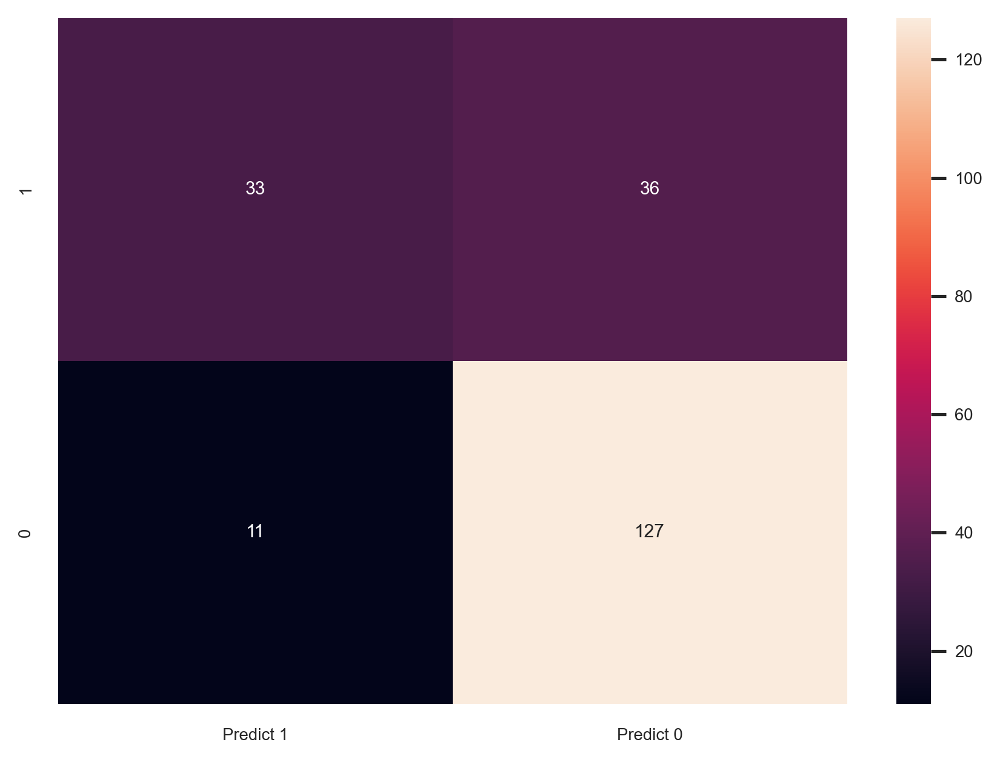

In [36]:
cm = metrics.confusion_matrix(y_test, y_pred_lr, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Logistic regression

##### To decide which Model is best for our dataset, we check the AUC of all models. Model with good AUC score is the best model for our dataset.

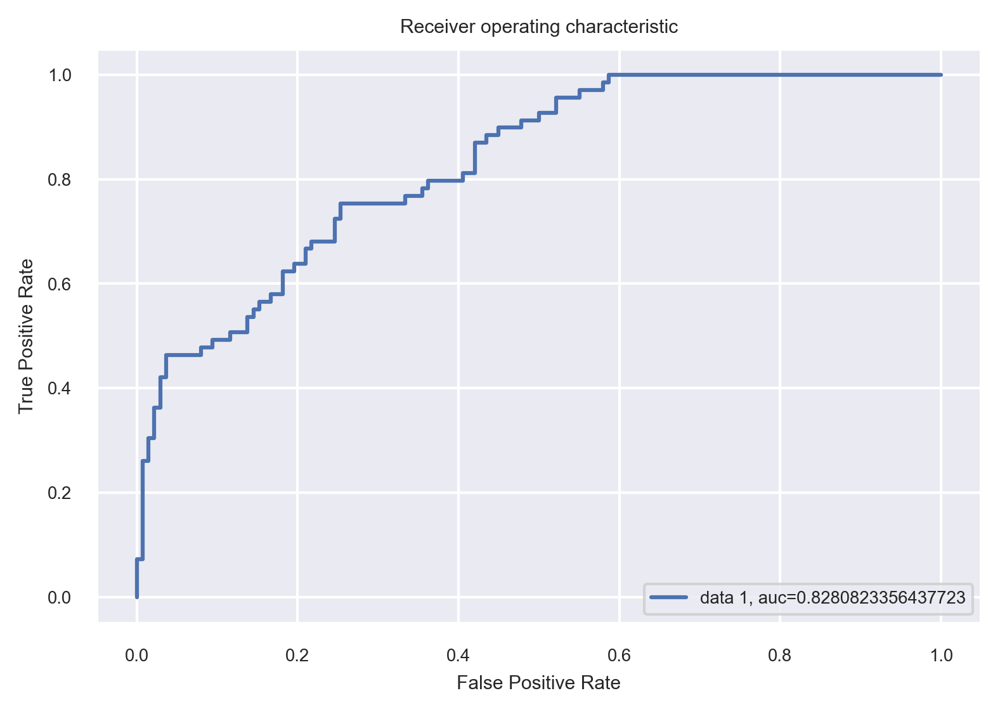

In [37]:
y_pred_proba = model.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of Logistic regression is 0.828, which is quite good enough

## Decision Tree Classifier

In [38]:
from sklearn.tree import DecisionTreeClassifier

dTree = DecisionTreeClassifier(criterion = 'gini', max_depth = 4, random_state = 42)
dTree.fit(X_train, y_train)

print(dTree.score(X_train,y_train))
print(dTree.score(X_test,y_test))

0.8
0.7198067632850241


Training dataset score and testing dataset score are almost similar and also high so it is not overfitting or underfitting.

In [39]:
y_pred_dtree = dTree.predict(X_test)

print(metrics.classification_report(y_test, y_pred_dtree))

              precision    recall  f1-score   support

           0       0.77      0.83      0.80       138
           1       0.60      0.49      0.54        69

    accuracy                           0.72       207
   macro avg       0.68      0.66      0.67       207
weighted avg       0.71      0.72      0.71       207



##### Accuracy of Decision Tree classifier model is 72%

### AUC of Decision Tree classifier model

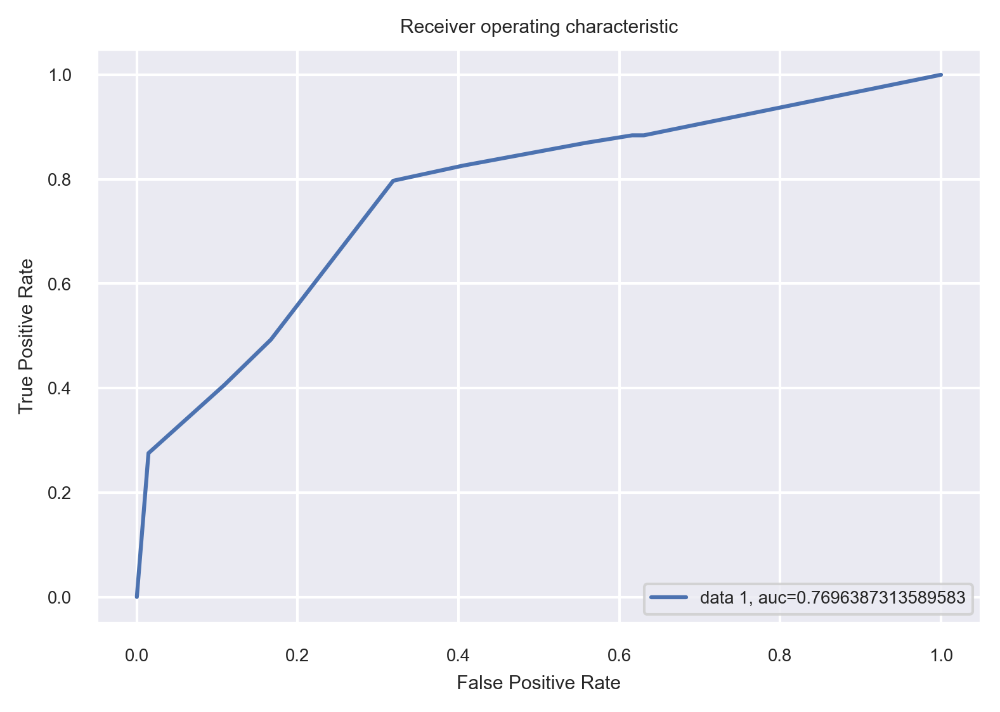

In [40]:
y_pred_proba = dTree.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of Decision Tree classifier model is 0.769

## Ensemble learning - Bagging

In [41]:
bgcl = BaggingClassifier(n_estimators = 100, base_estimator=dTree, random_state=42)

bgcl = bgcl.fit(X_train, y_train)

In [42]:
y_pred_bag = bgcl.predict(X_test)

print(bgcl.score(X_train,y_train))
print(bgcl.score(X_test,y_test))

0.84375
0.7681159420289855


Training dataset score and testing dataset score are almost similar and also high so it is not overfitting or underfitting.

In [43]:
print(metrics.classification_report(y_test, y_pred_bag))

              precision    recall  f1-score   support

           0       0.80      0.88      0.83       138
           1       0.69      0.55      0.61        69

    accuracy                           0.77       207
   macro avg       0.74      0.71      0.72       207
weighted avg       0.76      0.77      0.76       207



##### Accuracy of Bagging model is 77%

<AxesSubplot:>

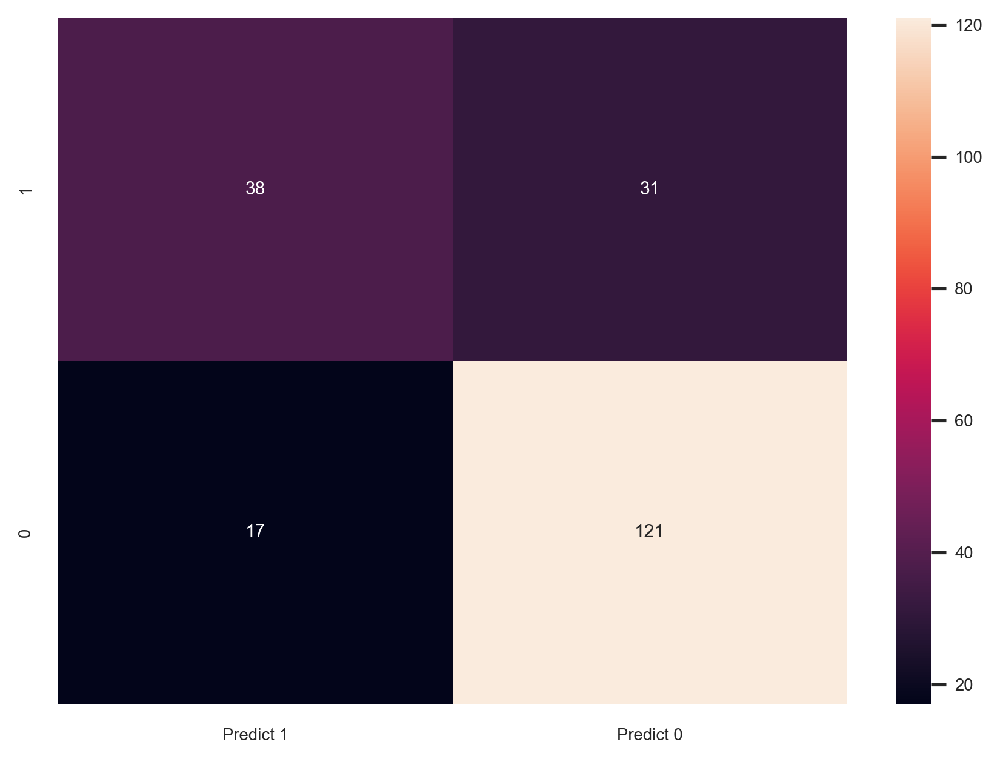

In [44]:
cm = metrics.confusion_matrix(y_test, y_pred_bag, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Bagging model

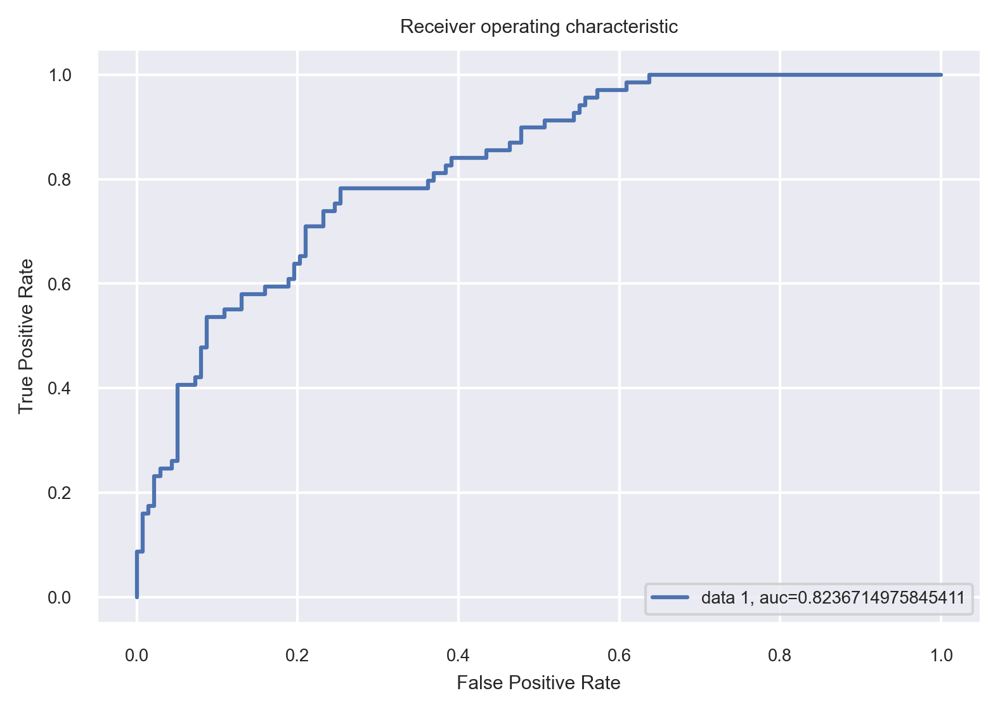

In [45]:
y_pred_proba = bgcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of Bagging model is 0.824

## Ensemble learning - AdaBoosting

In [46]:
abcl = AdaBoostClassifier(n_estimators=45, random_state=42)
abcl = abcl.fit(X_train, y_train)

In [47]:
y_pred_abcl = abcl.predict(X_test)

print(abcl.score(X_train, y_train))
print(abcl.score(X_test,y_test))

0.8416666666666667
0.7198067632850241


Training dataset score and testing dataset score are almost similar and also high so it is not overfitting or underfitting.

In [48]:
print(metrics.classification_report(y_test, y_pred_abcl))

              precision    recall  f1-score   support

           0       0.77      0.82      0.80       138
           1       0.59      0.52      0.55        69

    accuracy                           0.72       207
   macro avg       0.68      0.67      0.67       207
weighted avg       0.71      0.72      0.72       207



##### Accuracy of AdaBoost model is 72%

<AxesSubplot:>

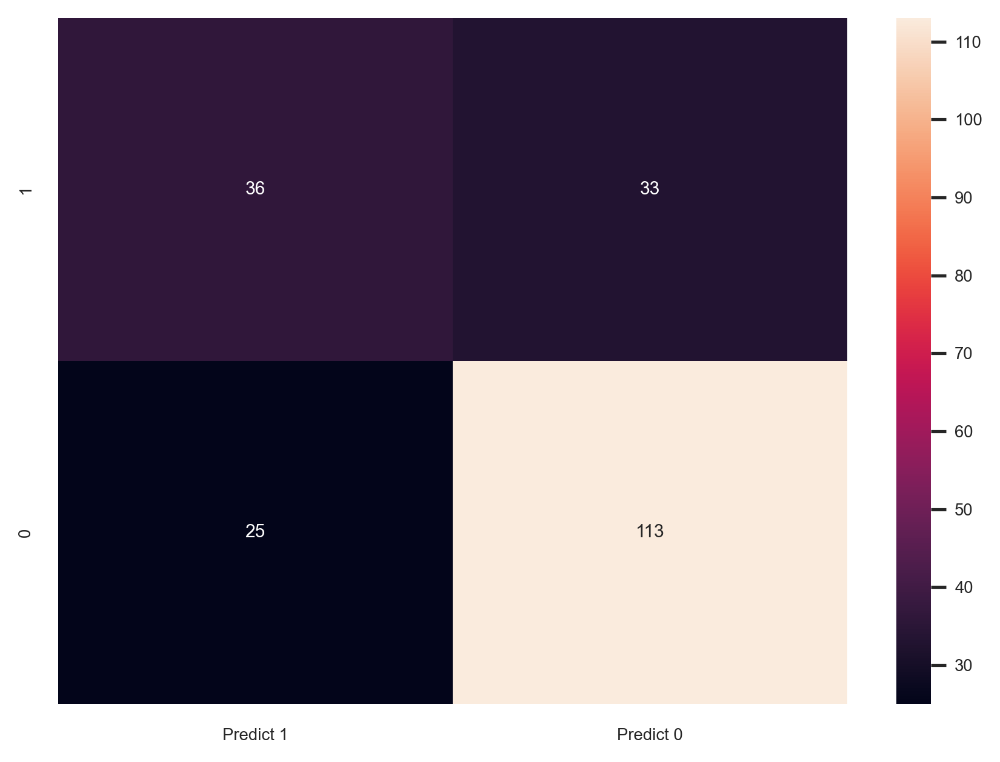

In [49]:
cm = metrics.confusion_matrix(y_test, y_pred_abcl, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of AdaBoost model

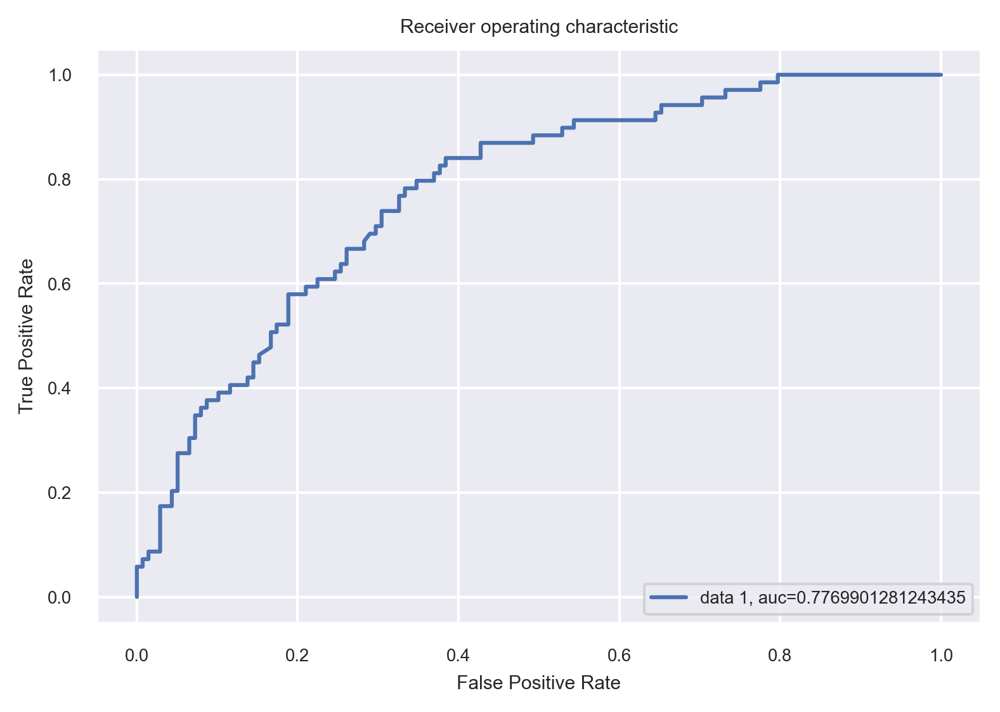

In [50]:
y_pred_proba = abcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of AdaBoost is 0.777

## Ensemble RandomForest Classifier

In [53]:
print(len(X.columns))
print(round(len(X.columns)**0.5,1))

8
2.8


Hence max_feature must be range from 2.8 means approximate 3 to any number like 7

In [54]:
rfcl = RandomForestClassifier(n_estimators=50, random_state=42, max_features=4)
rfcl = rfcl.fit(X_train, y_train)

y_pred_rf = rfcl.predict(X_test)

print(rfcl.score(X_test,y_test))

0.7632850241545893


In [55]:
print(metrics.classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.82      0.83      0.82       138
           1       0.65      0.62      0.64        69

    accuracy                           0.76       207
   macro avg       0.73      0.73      0.73       207
weighted avg       0.76      0.76      0.76       207



##### Accuracy of Random Forest Classifier model is 76%

<AxesSubplot:>

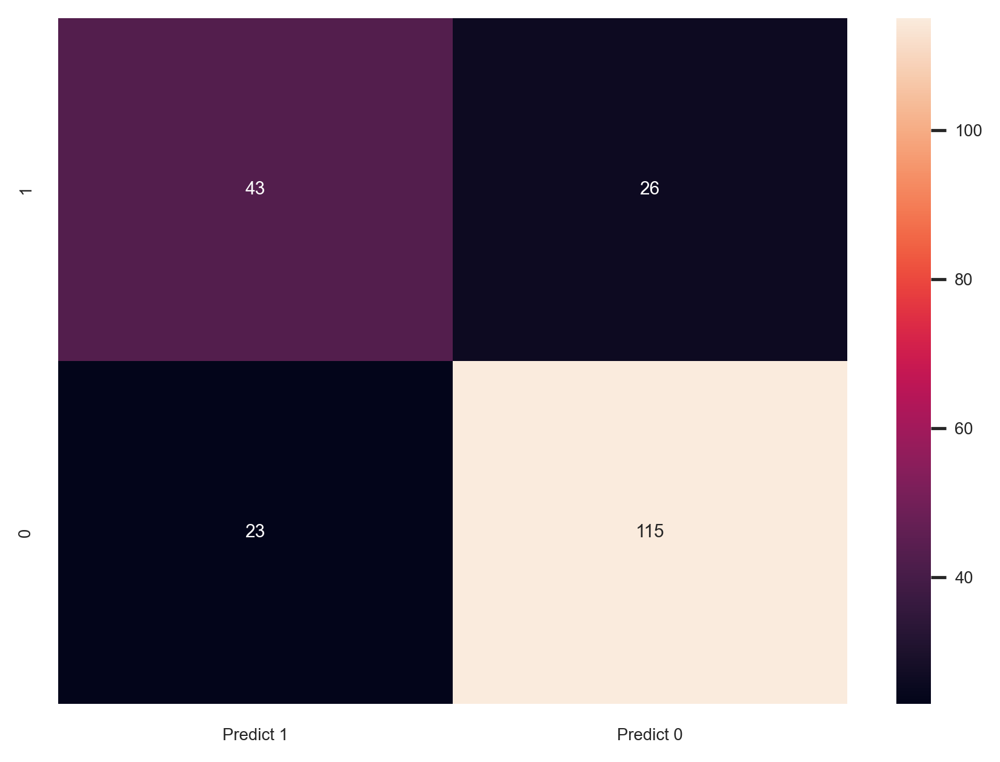

In [56]:
cm = metrics.confusion_matrix(y_test, y_pred_rf, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of Random Forest Classifier

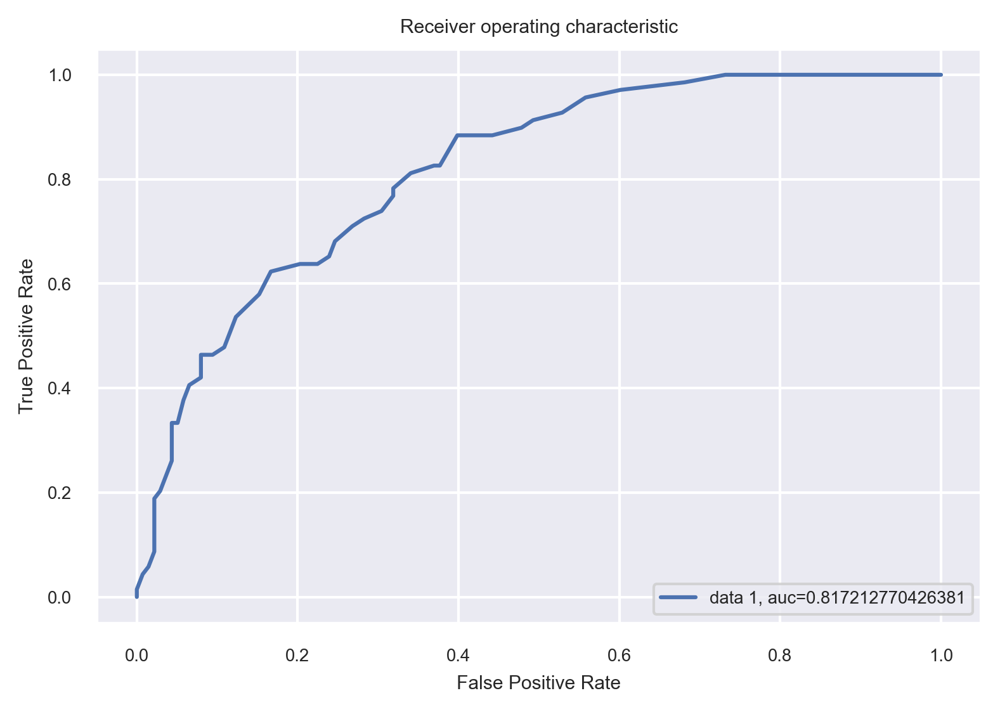

In [57]:
y_pred_proba = rfcl.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of Random Forest Classifier is 0.817

## kNN

In [58]:
knn = KNeighborsClassifier(n_neighbors=7, metric='euclidean')
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)
knn.score(X_test, y_test)

0.782608695652174

In [59]:
print(metrics.classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.82      0.86      0.84       138
           1       0.69      0.62      0.66        69

    accuracy                           0.78       207
   macro avg       0.76      0.74      0.75       207
weighted avg       0.78      0.78      0.78       207



##### Accuracy of KNN model is 78%

<AxesSubplot:>

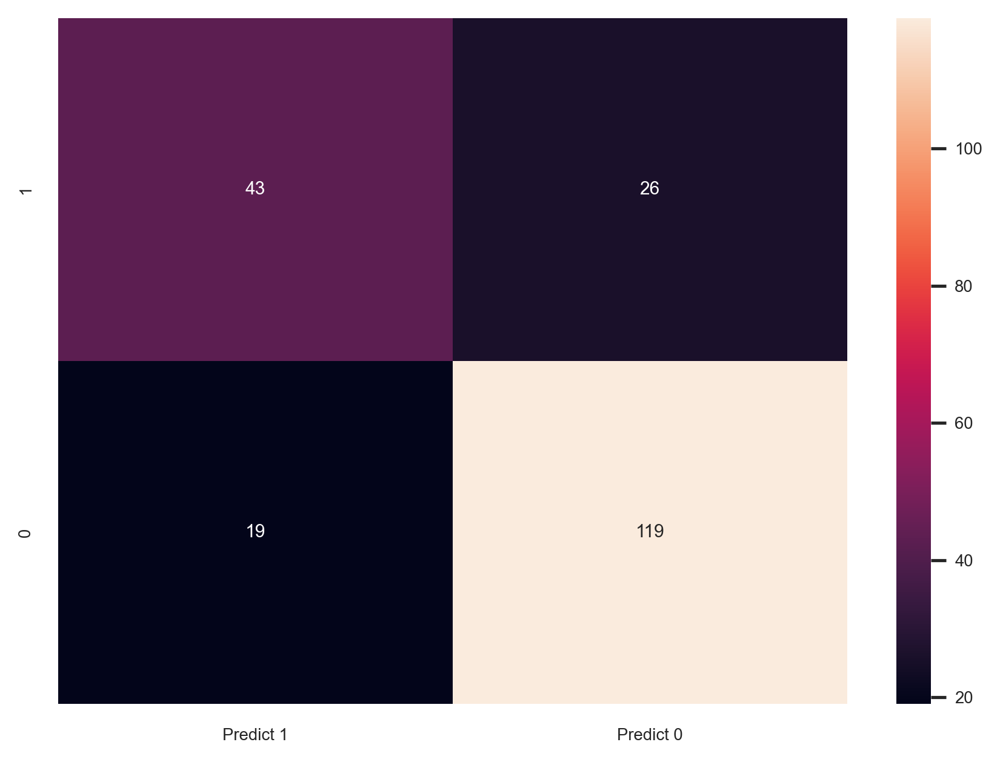

In [60]:
cm = metrics.confusion_matrix(y_test, y_pred_knn, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

### AUC of KNN

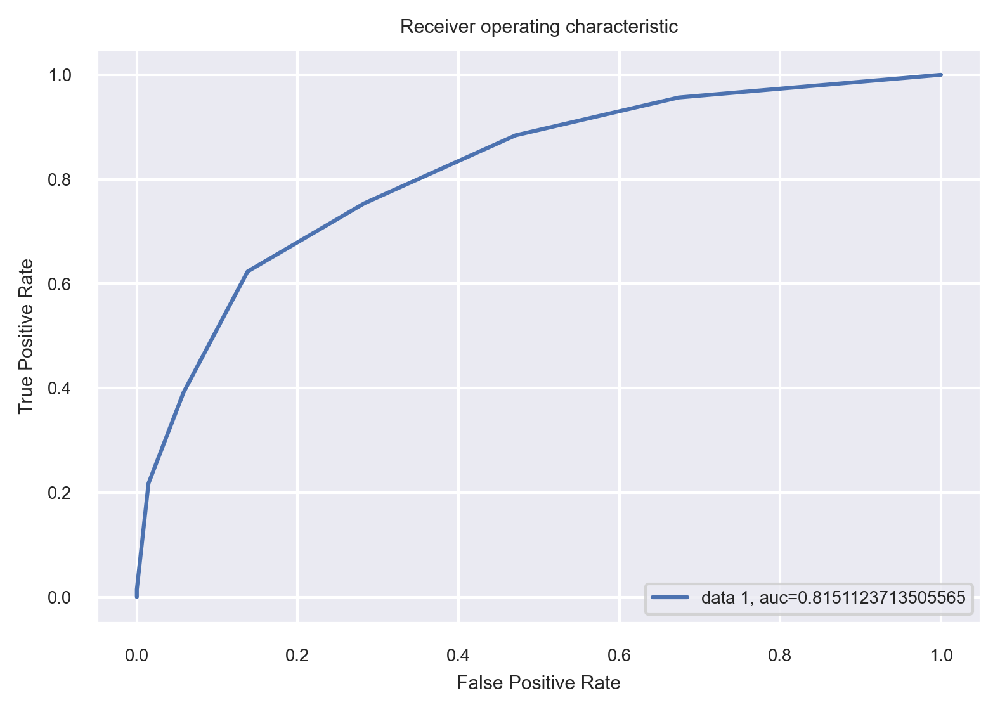

In [61]:
y_pred_proba = knn.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
fpr 
tpr

auc = metrics.roc_auc_score(y_test, y_pred_proba)
auc

plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

##### AUC score of KNN is 0.815

## SVM

In [62]:
from sklearn import svm
svm = svm.SVC(gamma=0.025, C=4)

svm.fit(X_train, y_train)

y_pred_svm = svm.predict(X_test)

svm.score(X_test, y_test)

0.7874396135265701

In [63]:
print(metrics.classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.77      0.96      0.86       138
           1       0.86      0.43      0.58        69

    accuracy                           0.79       207
   macro avg       0.82      0.70      0.72       207
weighted avg       0.80      0.79      0.76       207



##### Accuracy of SVM model is 79%

<AxesSubplot:>

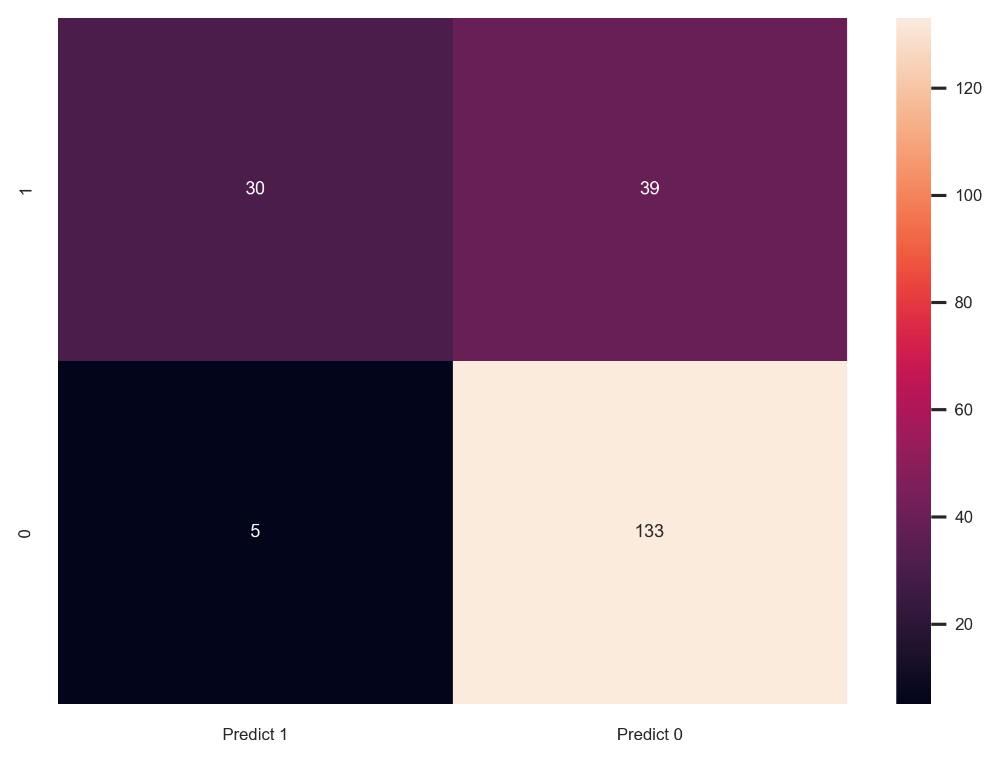

In [64]:
cm = metrics.confusion_matrix(y_test, y_pred_svm, labels=[1,0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                         columns = [i for i in ["Predict 1", "Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

# Comparision of all Models

In [65]:
data = {"Model name": ["Logistic Regression","Decision Tree Classifier","Bagging", "AdaBoost", "Random Forest Classifier", "kNN", "SVM"], "Accuracy(%)": ["77", "72", "77", "72", "76", "78", "79"], "AUC Score": ["0.828","0.769","0.824","0.777","0.817","0.815","NA"]}
Companrison = pd.DataFrame(data)
Companrison

,Model name,Accuracy(%),AUC Score
0,Logistic Regression,77,0.828
1,Decision Tree Classifier,72,0.769
2,Bagging,77,0.824
3,AdaBoost,72,0.777
4,Random Forest Classifier,76,0.817
5,kNN,78,0.815
6,SVM,79,NA


##### Logistic Regression has highest AUC Score hence Logistic Regression model is perfect model for our dataset. SVM model is also good model for our dataset as it is giving highest accuracy. Not only Logistic and SVM but also Bagging looks good as it has similar AUC score.

# Prediction System - Logistic Regression

In [67]:
#input data and transform into numpy array
in_data= np.asarray(tuple(map(float,input().rstrip().split(','))))

#reshape and scale the input array
in_data_re = in_data.reshape(1,-1)
in_data_sca = scaler.transform(in_data_re)

#print the predicted output for input array
print("This person has Diabetes" if model.predict(in_data_sca) else "This person don't have Diabetes")

0,137,40,35,168,43.1,2.288,33
This person has Diabetes


# Prediction System - SVM

In [68]:
#input data and transform into numpy array
in_data= np.asarray(tuple(map(float,input().rstrip().split(','))))

#reshape and scale the input array
in_data_re = in_data.reshape(1,-1)
in_data_sca = scaler.transform(in_data_re)

#print the predicted output for input array
print("This person has Diabetes" if svm.predict(in_data_sca) else "This person don't have Diabetes")

0,137,40,35,168,43.1,2.288,33
This person has Diabetes


# Prediction System - Bagging

In [69]:
#input data and transform into numpy array
in_data= np.asarray(tuple(map(float,input().rstrip().split(','))))

#reshape and scale the input array
in_data_re = in_data.reshape(1,-1)
in_data_sca = scaler.transform(in_data_re)

#print the predicted output for input array
print("This person has Diabetes" if bgcl.predict(in_data_sca) else "This person don't have Diabetes")

0,137,40,35,168,43.1,2.288,33
This person has Diabetes
